In [31]:
import pickle, os
# import matplotlib.pyplot as plt
# from wordcloud import WordCloud
import numpy as np
import pandas as pd
import pprint

In [2]:
import cupy

In [57]:
with open('convergence_check/distributions/run_0_distribution.pickle', 'rb') as f:
    dist = pickle.load(f)

with open('convergence_check/distributions/run_1_distribution.pickle', 'rb') as f:
    dist1 = pickle.load(f)

In [60]:
[list(dist[i].items())[-20:] for i in range(20)]


[[('stealth', 0.4020792362055745),
  ('britain', 0.40270167685038605),
  ('cod', 0.4051230446843346),
  ('franci', 0.4097212703610714),
  ('queen', 0.4104884702005069),
  ('south', 0.41263263648785764),
  ('island', 0.41687245709767096),
  ('sharp', 0.41865931032527387),
  ('royal', 0.42216696667299425),
  ('instal', 0.435561922519939),
  ('nuclear', 0.43724027347696326),
  ('georgia', 0.44032129666764386),
  ('sink', 0.44125668526520134),
  ('deep', 0.44403262528830506),
  ('past', 0.4496010389572138),
  ('domin', 0.4501453195030101),
  ('battl', 0.45020426322011486),
  ('bigger', 0.4945516549659884),
  ('insid', 0.5005748890803938),
  ('seal', 0.5008918466531721)],
 [('atheism', 0.275750512092162),
  ('livesey', 0.27621763595131665),
  ('happi', 0.2762677186579845),
  ('theist', 0.2772032041920389),
  ('atheist', 0.27889893962958184),
  ('nope', 0.28289347848617025),
  ('bunch', 0.2859027251348387),
  ('pose', 0.28898401698749393),
  ('someon', 0.28966338004788894),
  ('schneider', 0

In [61]:
[list(dist1[i].items())[-20:] for i in range(20)]

[[('steel', 0.3569160846419363),
  ('deep', 0.3601092562883064),
  ('sustain', 0.36355591672041376),
  ('fight', 0.37020679855036626),
  ('twin', 0.3717773665917364),
  ('crack', 0.3766562966157795),
  ('secret', 0.3770557002597592),
  ('militari', 0.37930930091932313),
  ('bad', 0.3819645941186284),
  ('react', 0.39135505806236387),
  ('attack', 0.3957848903516639),
  ('dare', 0.3967257499746529),
  ('blast', 0.4156623710391479),
  ('trap', 0.42161780984384384),
  ('flash', 0.4357369657797185),
  ('brother', 0.43684659976100904),
  ('shield', 0.4402097607613729),
  ('brad', 0.4480100078558052),
  ('hide', 0.4583237252484313),
  ('arriv', 0.4600786845190099)],
 [('hudson', 0.28900780249126057),
  ('bench', 0.28947945404286657),
  ('weak', 0.2909900799826069),
  ('pen', 0.2969587398100762),
  ('sake', 0.29768085183274934),
  ('hmmm', 0.3119816294416551),
  ('dean', 0.3135808970193721),
  ('walker', 0.3244110345644474),
  ('genesi', 0.33225936148258517),
  ('stupid', 0.33722817993968657)

In [4]:
with open('sanity_check/small_chunk_run_1_whitened.pickle', 'rb') as f:
    run1 = pickle.load(f)

with open('sanity_check/small_chunk_run_2_whitened.pickle', 'rb') as f:
    run2 = pickle.load(f)

In [5]:
cupy.allclose(run2, run1, rtol=0, atol=1e-10)

array(True)

In [6]:
run1[1] == run2[1]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

In [ ]:
any(cupy.allclose(run2[1], run1[i], rtol=0, atol=1e-5) for i in range(run2.shape[0]))

In [7]:
run1[1]

array([-0.55150859,  1.17174959, -0.27079839, -0.49838927, -0.06918851,
        0.18714383, -0.35646019, -0.42305381, -0.48482096, -0.15755472,
       -0.17437947,  0.00188256,  0.07972133,  0.10634796, -0.13698382,
       -0.36896229, -0.03623898,  0.04706107,  0.01469926, -0.10529826])

In [8]:
run2[1]

array([-0.55150859,  1.17174959, -0.27079839, -0.49838927, -0.06918851,
        0.18714383, -0.35646019, -0.42305381, -0.48482096, -0.15755472,
       -0.17437947,  0.00188256,  0.07972133,  0.10634796, -0.13698382,
       -0.36896229, -0.03623898,  0.04706107,  0.01469926, -0.10529826])

In [2]:
with open('sanity_check/small_chunk_run_1_distribution.pickle', 'rb') as f:
    prev_week1 = pickle.load(f)

with open('sanity_check/small_chunk_run_2_distribution.pickle', 'rb') as f:
    week1 = pickle.load(f)

# these 2 should be roughly the same

In [3]:
# set comparison on top 20 words
co_mat = np.empty((20,20))
for i in range(20):
    for j in range(20):
        co_mat[i,j] = len(set(list(prev_week1[i].keys())[-20:]) - set(list(week1[j].keys())[-20:]))

pd.DataFrame(co_mat) # Topics don't correspond at all!?

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,20.0,20.0,20.0,18.0,20.0,19.0,20.0,20.0,20.0,20.0,20.0,20.0,19.0,20.0,20.0,19.0,20.0,20.0,20.0,20.0
1,20.0,20.0,19.0,19.0,20.0,20.0,17.0,20.0,20.0,20.0,20.0,20.0,20.0,19.0,20.0,18.0,20.0,19.0,20.0,20.0
2,20.0,20.0,15.0,20.0,20.0,20.0,20.0,20.0,19.0,19.0,20.0,20.0,20.0,16.0,20.0,20.0,20.0,18.0,17.0,19.0
3,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,19.0,20.0,20.0,19.0,10.0,20.0,20.0,20.0,18.0
4,20.0,20.0,20.0,20.0,19.0,20.0,20.0,20.0,20.0,16.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0
5,16.0,20.0,19.0,20.0,20.0,20.0,19.0,20.0,19.0,18.0,20.0,20.0,20.0,17.0,20.0,20.0,20.0,19.0,20.0,20.0
6,20.0,20.0,18.0,19.0,19.0,20.0,20.0,20.0,20.0,20.0,20.0,17.0,13.0,20.0,20.0,20.0,20.0,19.0,20.0,20.0
7,20.0,20.0,20.0,20.0,20.0,20.0,19.0,20.0,19.0,20.0,20.0,20.0,20.0,20.0,17.0,14.0,20.0,19.0,20.0,19.0
8,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,17.0,20.0,20.0,17.0,14.0,20.0,20.0,20.0,19.0
9,20.0,20.0,19.0,20.0,20.0,20.0,15.0,12.0,15.0,19.0,20.0,20.0,20.0,20.0,20.0,20.0,19.0,18.0,19.0,20.0


In [4]:
np.min(co_mat)

10.0

In [5]:
pd.DataFrame([list(prev_week1[i].keys())[-20:] for i in range(20)])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,actually,yeah,seriously,stupid,imagine,talking,idea,thought,inject,wow,oh,shit,dumb,damn,man,idiot,fuck,literally,fucking,guy
1,cause,suffering,normal,earth,infected,sars cov,old,fear,antibodies,immune,cov,immunity,read,viruses,vaccines,different,vaccine,corona virus,corona,sars
2,animals,relief,people,coronavirus crisis,spoke,society,businesses,bible,covid_19,read https,coronavirus pandemic,positive coronavirus,fight coronavirus,coronavirus,face,young,amid,amid coronavirus,police,coronavirus https
3,access,feel,resources,health care,good,mental,mental health,services,public health,looking,workers,safety,like,health,minister,looks,public,important,thank,happy
4,sent,failed,knew,democrats,russia,lies,chinese,cut,january,biden,party,november,highest,wuhan,responsible,america,country,china,blame,obama
5,york,small,coronavirus covid19,coronaviruspandemic,governor,online,socialdistancing,parents,safe,businesses,covid19 coronavirus,covid_19,time,orders,stay safe,order,stayhome,stay,home,stay home
6,hey,understand,protect,long,right,better,think,work,care,forget,worry,doesn,know,let,don know,tell,want,say,need,don
7,wow,piece,center,concerns,cov,conditions,world,public,study,absolutely,article,interesting,public health,mental,thread,sars,mental health,health care,health,sars cov
8,department,tracing,healthcare,public health,health care,lab,international,officials,homes,health,frontline,coronavirus outbreak,nhs,staff,crisis,care,outbreak,workers,concerns,key
9,new,suggests,week,new coronavirus,news,new york,york,says,fox,shows,coronavirus lockdown,cuomo,news https,news coronavirus,breaking,latest,bbc news,bbc,johnson,daily


In [6]:
pd.DataFrame([list(week1[j].keys())[-20:] for j in range(20)])


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,gt,fight covid,coronavirusoutbreak,visit,coronaviruspandemic,current,covidー19,staysafe,today,stayhome,covid 19,19,covid,19 pandemic,covid19 coronavirus,covid19,2020,covid19 https,covid19 pandemic,coronavirus covid19
1,trump,lie,win,amazing,self,plan,power,decision,vote,proud,action,strategy,god,use,covid19 pandemic,leader,leaders,great,needs,leadership
2,don know,read https,fauci,future,covid_19,know,thanks,economy,coronavirus lockdown,read,did know,hi,society did,spoke,society,watch,cashless society,bible,cashless,jesus
3,ll,little,ve,man,longer,fuck,thing,soon,quarantine,away,let,got,year,old,just,gonna,guys,hope,month,end
4,reported,want,africa,million,means,bringing,countries,number,county,increase,country,total,recovered,day,active,19 cases,confirmed cases,confirmed,coronavirus cases,cases
5,50 000,republicans,look,election,said,dead,inject,didn,white,lead,nearly,office,president,hoax,states,response,georgia,florida,realdonaldtrump,americans
6,threat,suggests,corona virus,virus https,york,new york,kill virus,cuomo,states,viruses,cure,kill,drug,scientists,new coronavirus,novel,treatment,world,hoax,vaccine
7,youtube,coverage,market,times,uk,report,watch,latest,global pandemic,fox,bbc news,bbc,fake news,fake,breaking,news coronavirus,news https,news,story,global
8,join,results,link,cuomo,blood,petition,efforts,battle,air,new coronavirus,study,video,city,york,new york,new,novel,youtube,impact,relief
9,france,travel,30,near,coronavirus lockdown,sent,lockdown https,ppe,govt,australia,sweden,covid_19,time,wuhan,eu,italy,jan,russia,china,lockdown


In [7]:
dist_weeks = [prev_week1, week1]

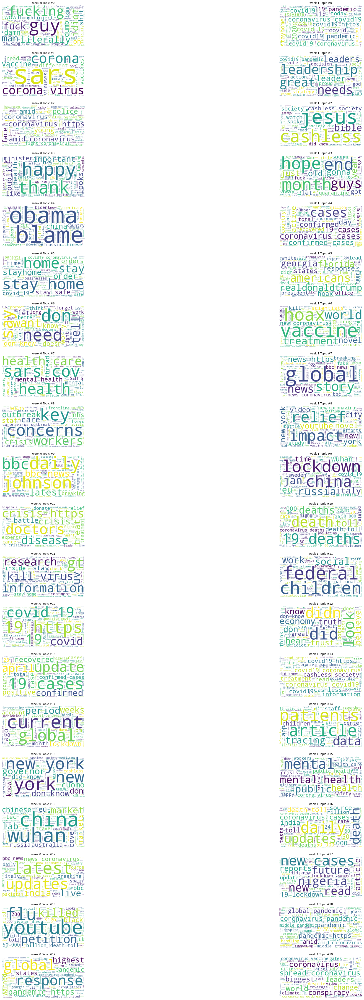

In [8]:
# dispay topic wordclouds
fig, axs = plt.subplots(len(dist_weeks[0]),len(dist_weeks), figsize=(40, 80), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
plt.axis("off")
    
# axs = axs.ravel()
for week in range(len(dist_weeks)):
    for t in range(len(dist_weeks[0])):
        # axs[t].figure()
        axs[t,week].axis("off")
        # axs[t].title("Topic #" + str(t))
        axs[t,week].imshow(WordCloud(background_color='white').fit_words(dist_weeks[week][t]))
        axs[t,week].set_title("week " + str(week) + " Topic #" + str(t))